# Self-Driving Car Engineer Nanodegree


## Project: **Advance Lane Lines** 
***

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
# %matplotlib inline

import numpy as np
import cv2
import glob
from calibration import calibrate_camera
from lane_utils import *
from thresh_utils import *
from line import Line

In [2]:
# import matplotlib
# matplotlib.use('Agg')

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


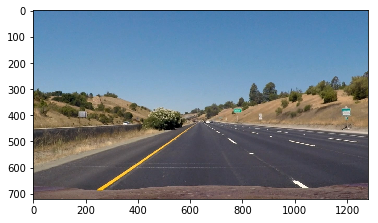

In [3]:
#reading in an image
image = mpimg.imread('media/test_images/straight_lines1.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

### 1. Calibrate Camera, compute distortion coefficients and undistort image

In [4]:
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

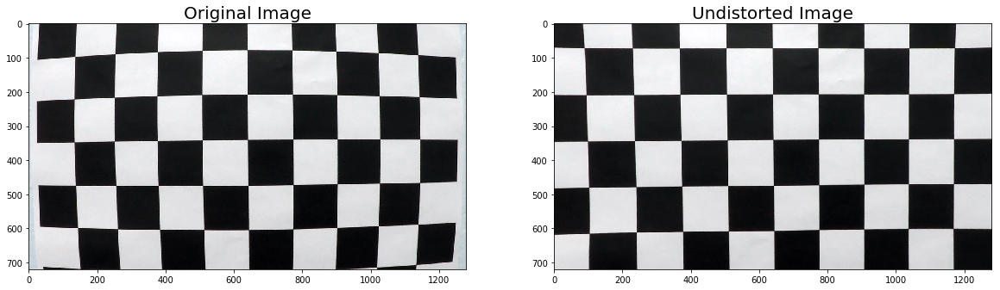

In [5]:
# undistort test image
img = cv2.imread('media/camera_cal/calibration1.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('media/output_images/test_undist.jpg', dst[:, :, ::-1])

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=20)

plt.savefig('media/examples/undistort_output.png', bbox_inches='tight')

In [6]:
# Load and store all images
img_paths = glob.glob('media/test_images/*.jpg')
imgs = []
img_names = []
for img_path in img_paths:
    img_names.append(img_path.split('/')[-1])
    img = mpimg.imread(img_path)
    imgs.append(img)

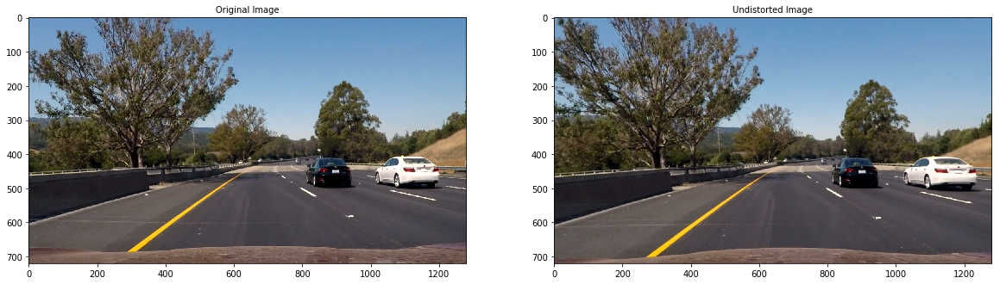

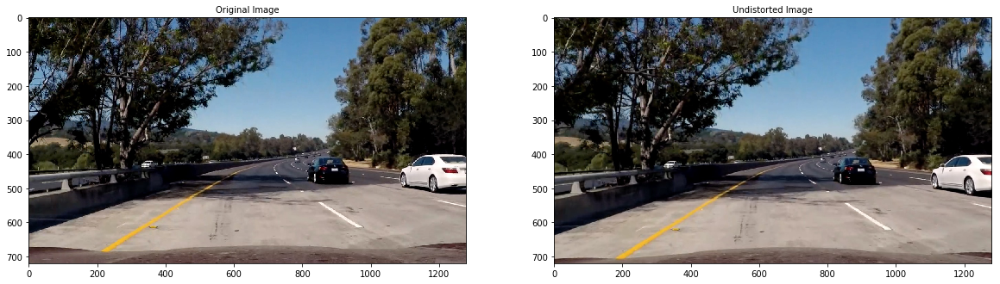

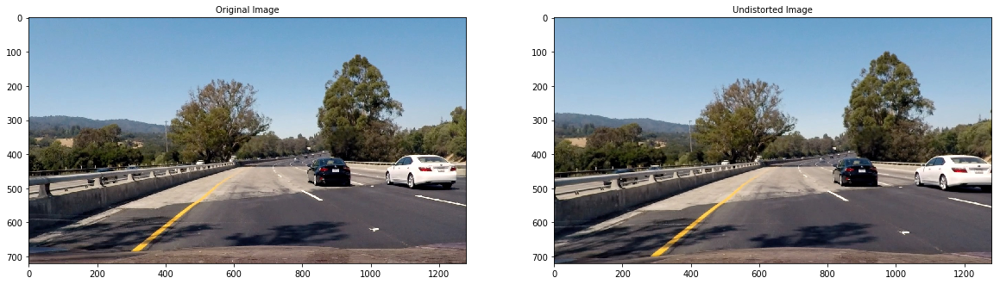

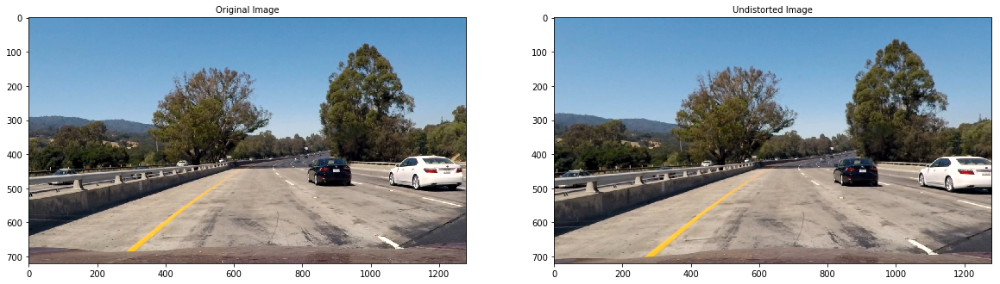

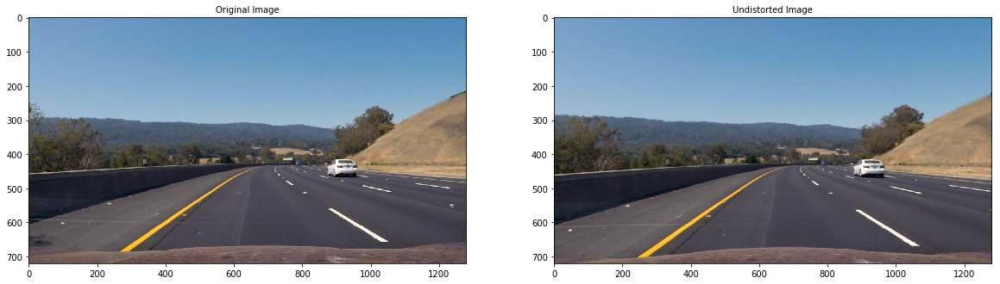

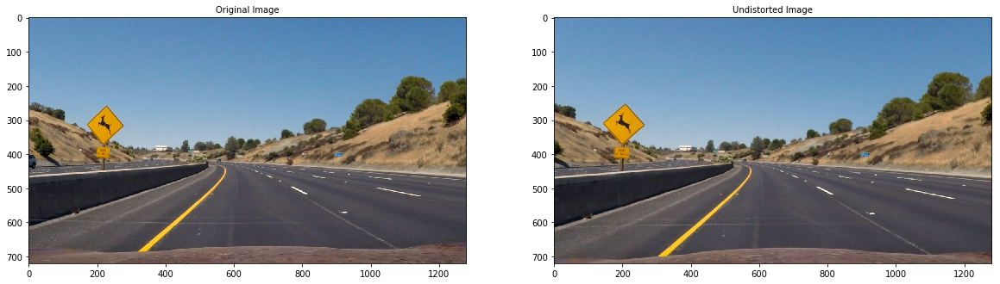

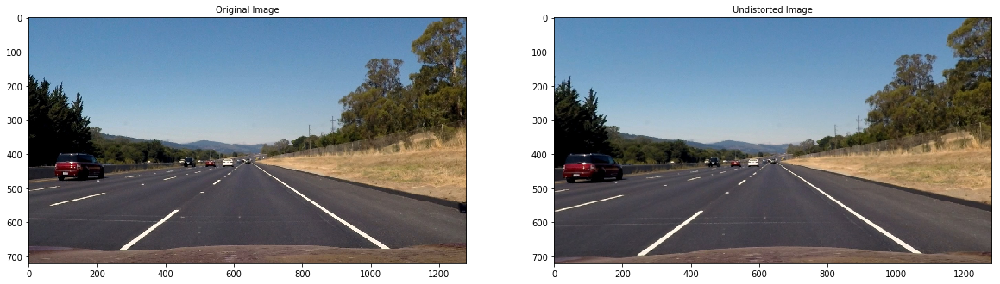

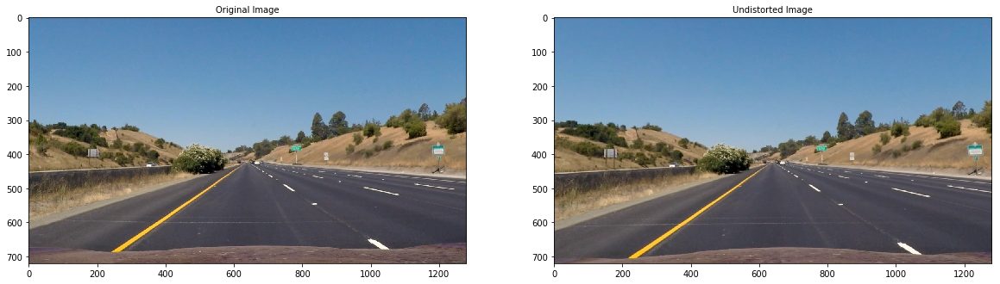

In [7]:
# Undistort all images and save them
undistorted = []
for img, img_name in zip(imgs, img_names):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted.append(dst)
    cv2.imwrite('media/output_images/undist_{}'.format(img_name), dst[:, :, ::-1])

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=10)

### 2. Perspective Transform

In [8]:
# Setting the source and destination coordinates by eyeballing
# y_top = 450
# y_bottom = 720
img_size = image.shape[:2]
# shift = 0

src = np.float32([
    [img_size[1] // 2 - 60, img_size[0] - 270],
    [img_size[1] // 2 + 80, img_size[0] - 270],
    [30, img_size[0]],
    [img_size[1], img_size[0]]
])

dst = np.float32([
    [0, 0],
    [img_size[1], 0],
    [0, img_size[0]],
    [img_size[1], img_size[0]]
])

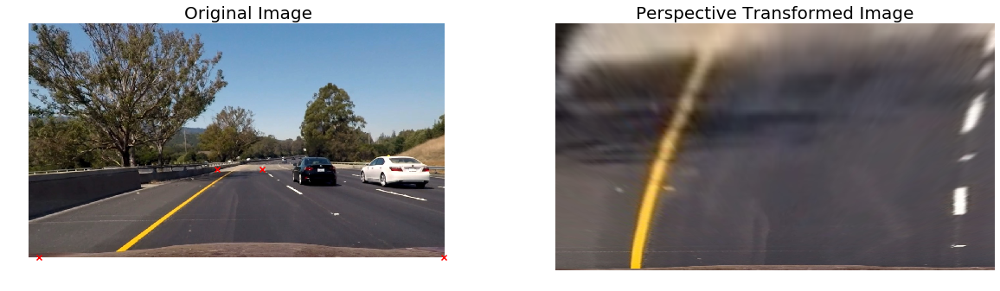

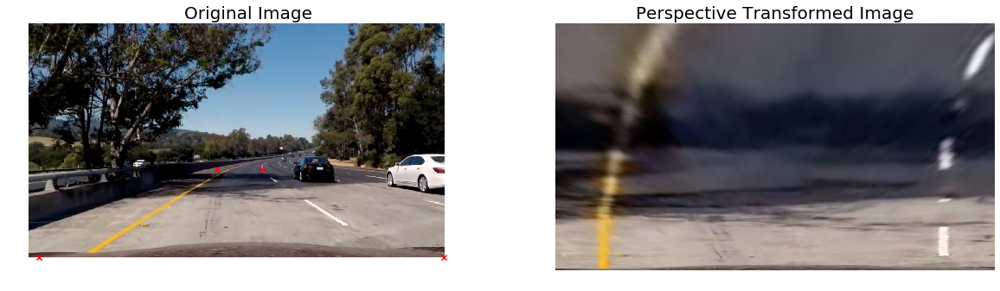

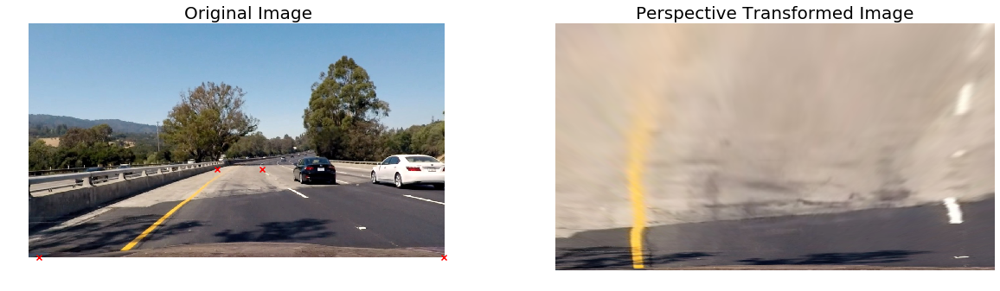

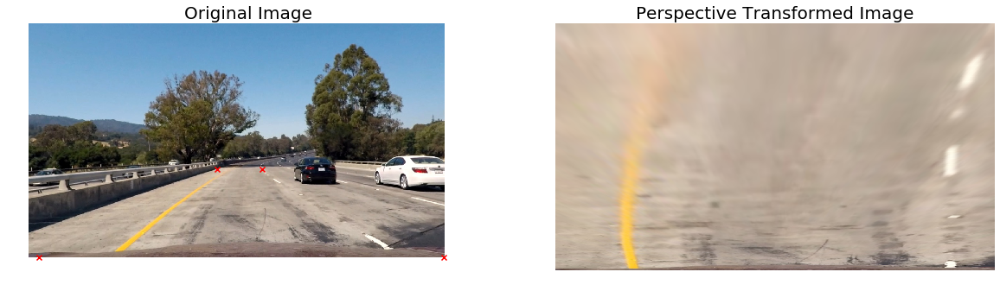

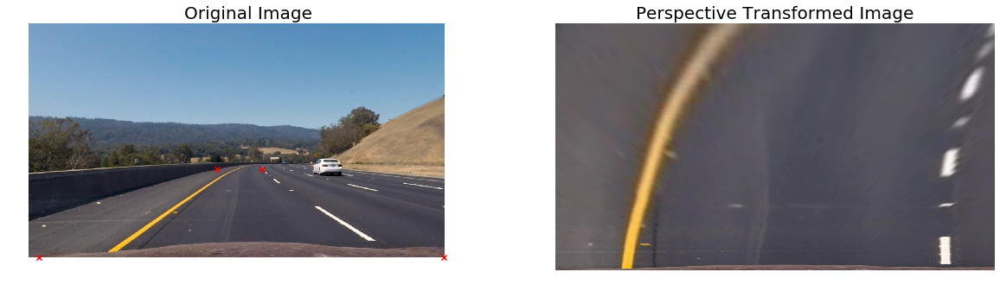

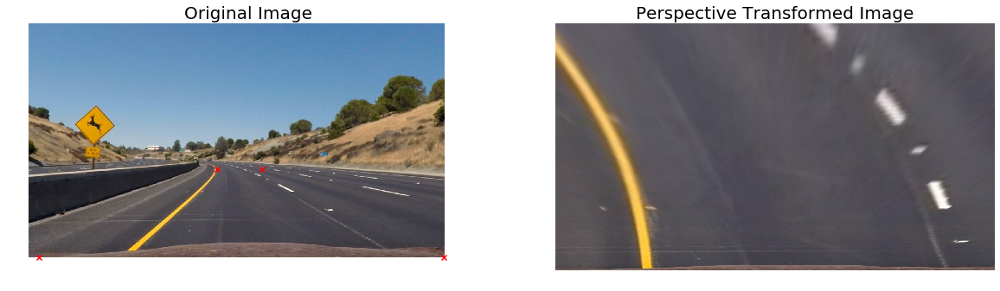

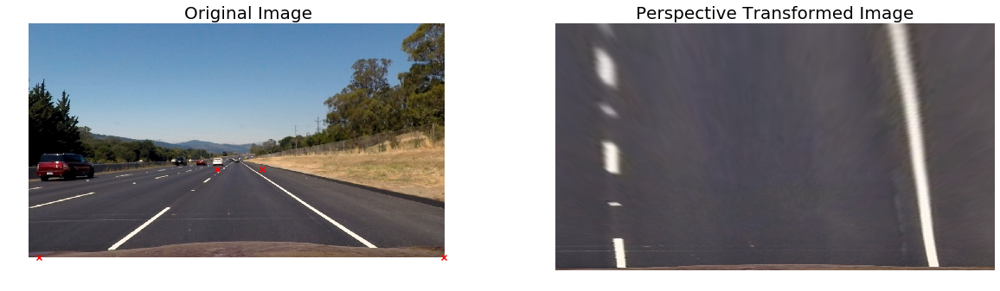

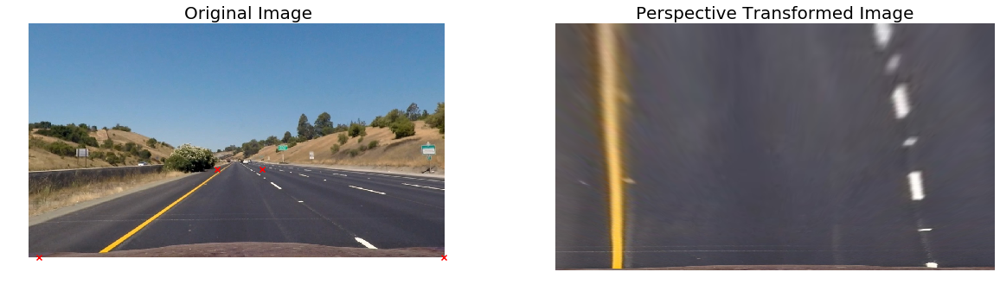

In [11]:
warped_images = []
Minvs = []
for img, img_name in zip(undistorted, img_names):
    img_size = img.shape[:2][::-1]
    # print(img_size)
    M = cv2.getPerspectiveTransform(src, dst)
    
    # inverse transform
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # store it for use later
    Minvs.append(Minv)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    warped_images.append(warped)
#     cv2.imwrite('media/output_images/perspective_{}'.format(img_name), warped[:, :, ::-1])
    
    f, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].imshow(img)
    ax[0].scatter(src[:, 0], src[:, 1], c='r', marker='x')
#     ax[0].scatter(dst[:, 0], dst[:, 1])
    ax[0].set_title('Original Image', fontsize=20)
    ax[1].imshow(warped, cmap='gray')
    ax[1].set_title('Perspective Transformed Image', fontsize=20)
    ax[0].axis('off')
    ax[1].axis('off')
    f.savefig('media/output_images/perspective_{}'.format(img_name), bbox_inches='tight')

### 3. Color/transform based threshold
Using a combination of color-space based directional gradient based thresholds to get the best binary warped image.
I use a threshold on the L-channel (HLS), B-channel (LAB) and SobelX gradient magnitude after several trial-and-errors.

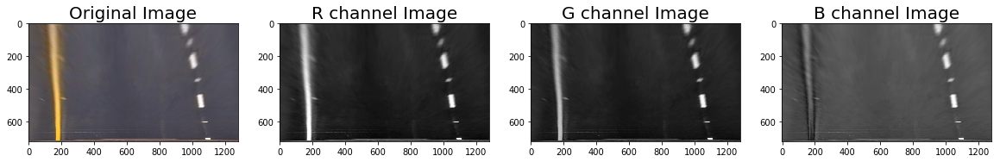

In [12]:
channel_r = warped[:, :, 0]
channel_g = warped[:, :, 1]
channel_b = warped[:, :, 2]
f, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(warped)
ax[0].set_title('Original Image', fontsize=20)
ax[1].imshow(channel_r, cmap='gray')
ax[1].set_title('R channel Image', fontsize=20)
ax[2].imshow(channel_g, cmap='gray')
ax[2].set_title('G channel Image', fontsize=20)
ax[3].imshow(channel_b, cmap='gray')
ax[3].set_title('B channel Image', fontsize=20)
plt.show()

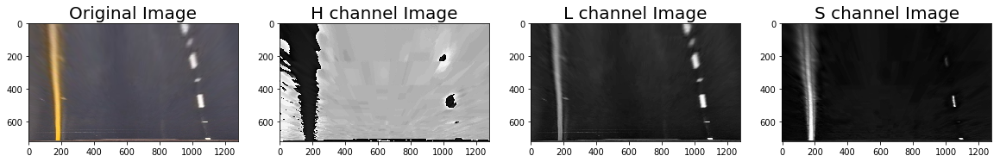

In [13]:
# convert to hls 
hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
channel_h = hls[:, :, 0]
channel_l = hls[:, :, 1]
channel_s = hls[:, :, 2]
f, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(warped)
ax[0].set_title('Original Image', fontsize=20)
ax[1].imshow(channel_h, cmap='gray')
ax[1].set_title('H channel Image', fontsize=20)
ax[2].imshow(channel_l, cmap='gray')
ax[2].set_title('L channel Image', fontsize=20)
ax[3].imshow(channel_s, cmap='gray')
ax[3].set_title('S channel Image', fontsize=20)
plt.show()

In [14]:
# Kernel size for the Sobel operator
ksize = 5

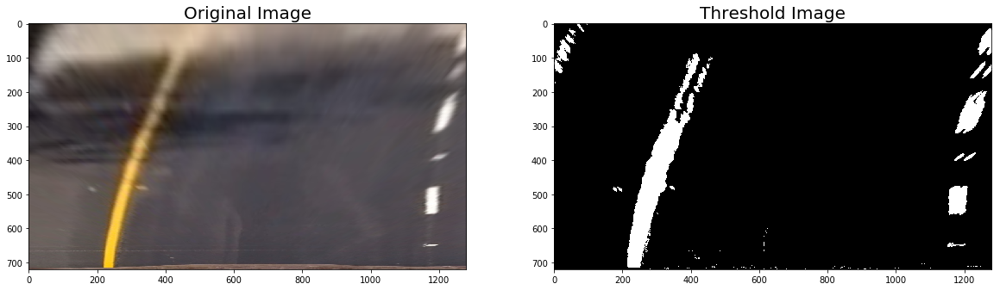

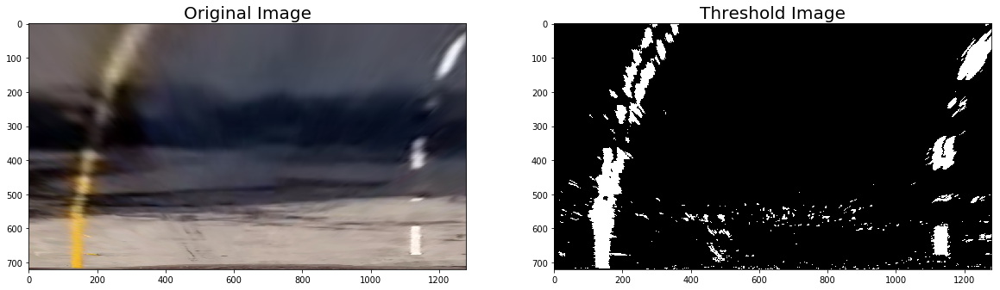

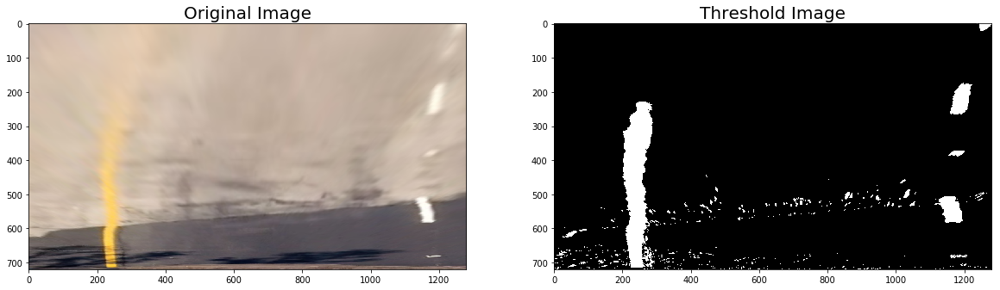

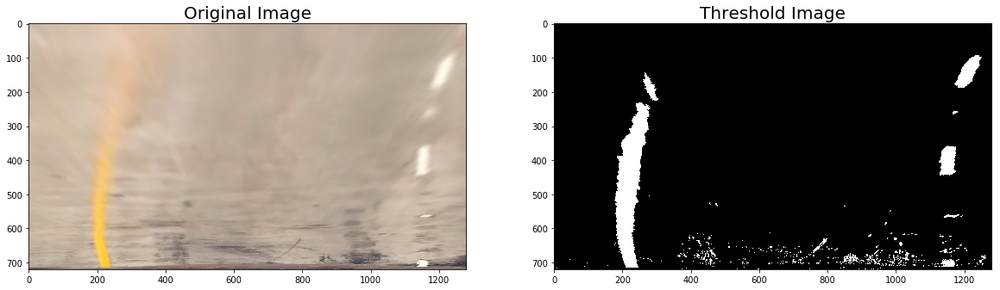

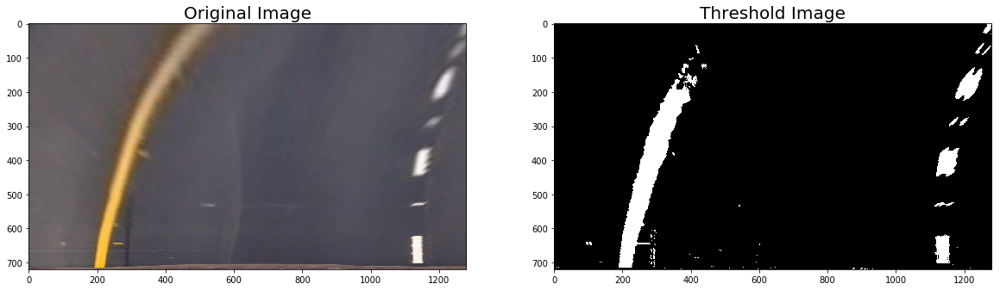

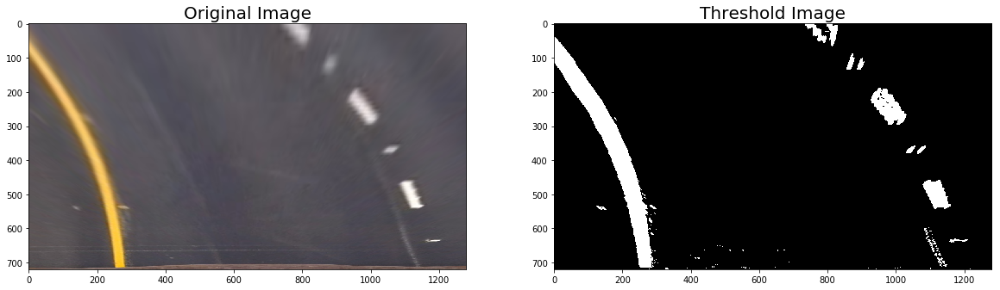

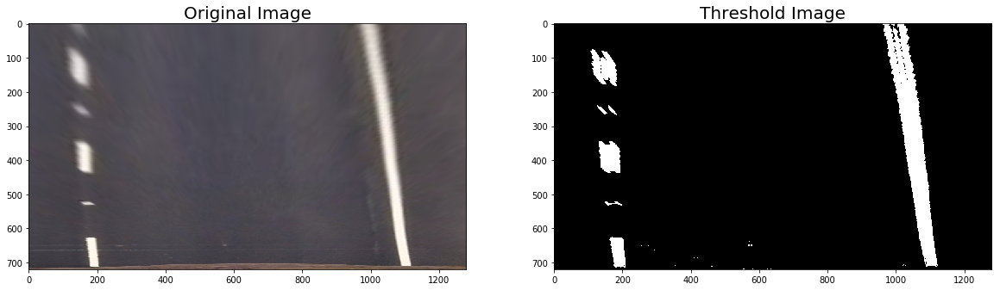

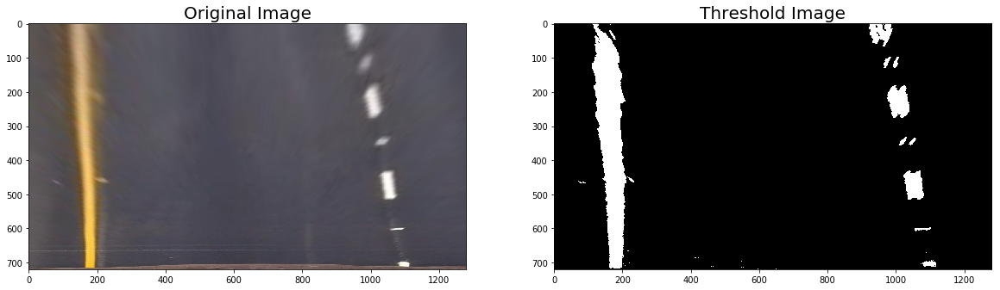

In [15]:
thresholded = []
for i, (warped, img_name) in enumerate(zip(warped_images, img_names)):
#     if i != 1:
#         continue
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(20, 225))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(10, 50))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.1, 0.5))
    hls_binary = hls_channel_threshold(warped, channel='l', thresh=210)
    lab_binary = lab_channel_threshold(warped, channel='b', thresh=150)
    r_binary = r_channel_threshold(warped, thresh=150)
    
    combined = np.zeros_like(dir_binary)
    # combined[((dir_binary == 1) | (mag_binary == 1)) & (r_binary == 1)] = 1
    combined[(hls_binary == 1) | (lab_binary == 1) | (gradx == 1)] = 1
    thresholded.append(combined)
    
    cv2.imwrite('media/output_images/binary_warp_{}'.format(img_name), combined * 255)
    
    f, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].imshow(warped)
    ax[0].set_title('Original Image', fontsize=20)
    ax[1].imshow(combined, cmap='gray')
    ax[1].set_title('Threshold Image', fontsize=20)

### 4. Fitting polynomials to the Lane Lines

In [19]:
histogram = np.sum(thresholded[0][thresholded[0].shape[0]//2:,:], axis=0)

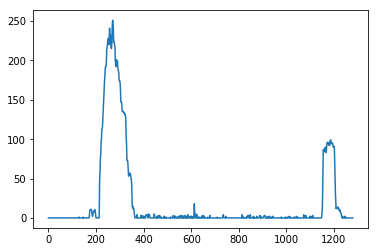

In [23]:
plt.plot(histogram)
plt.savefig('media/examples/histogram.png', bbox_inches='tight')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


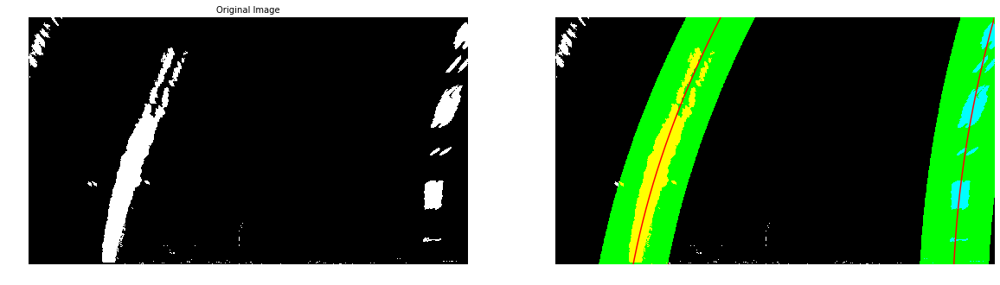

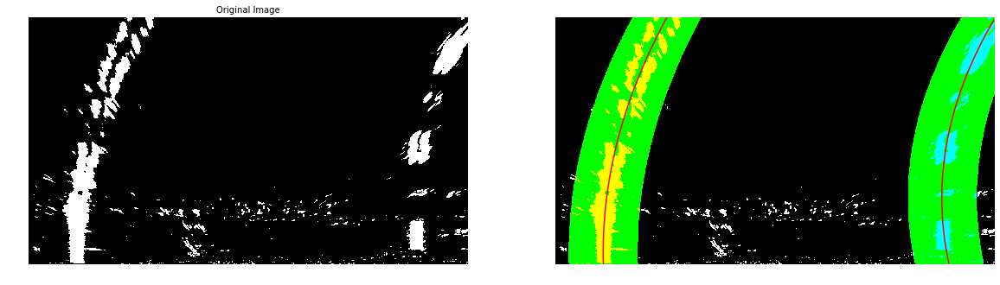

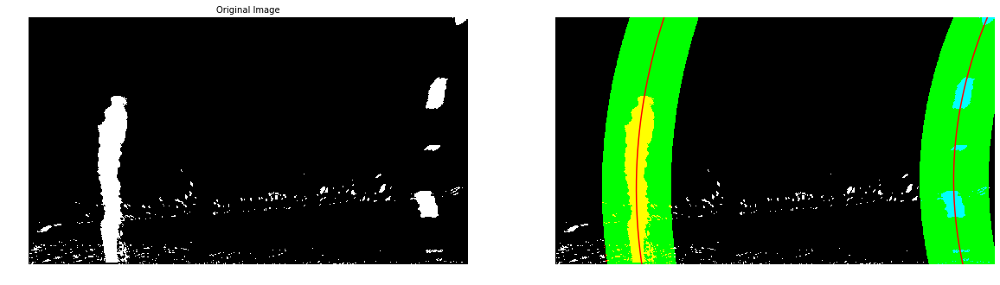

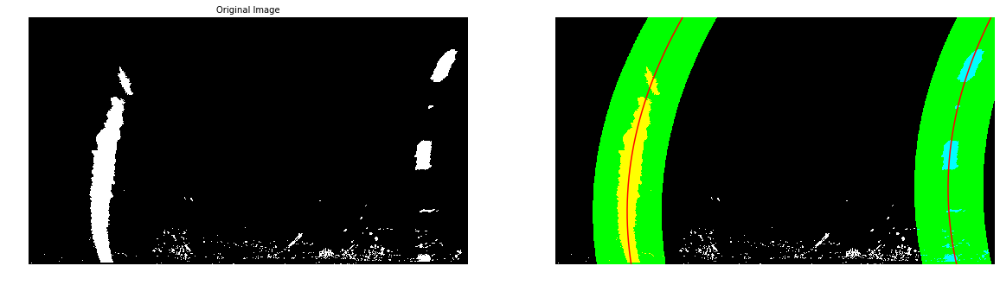

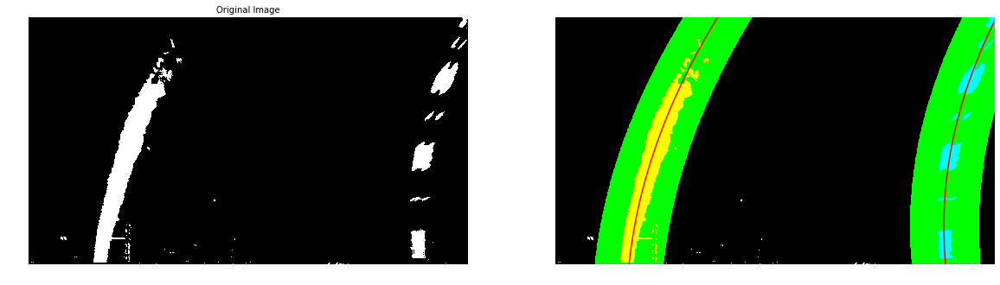

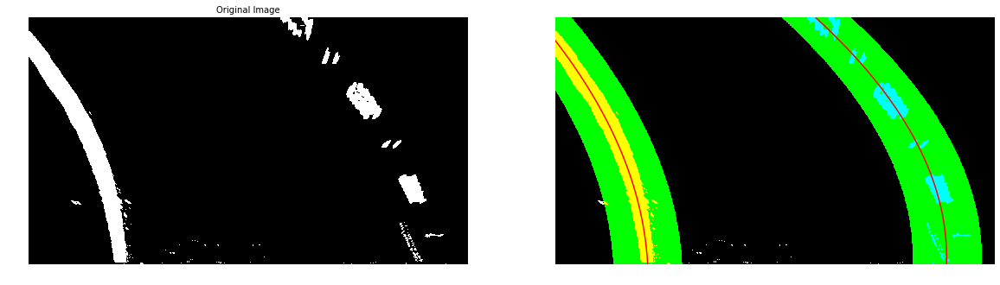

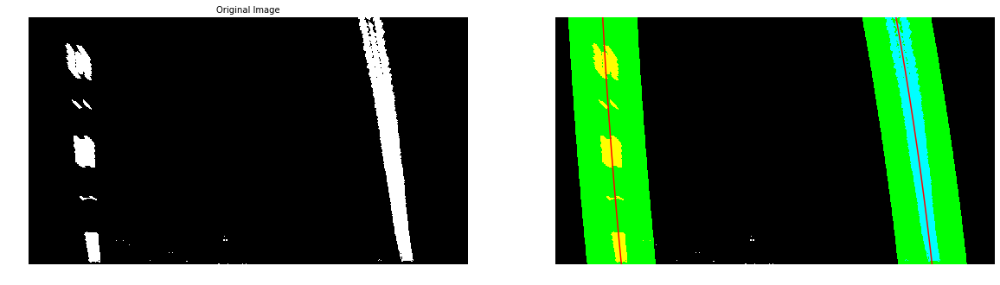

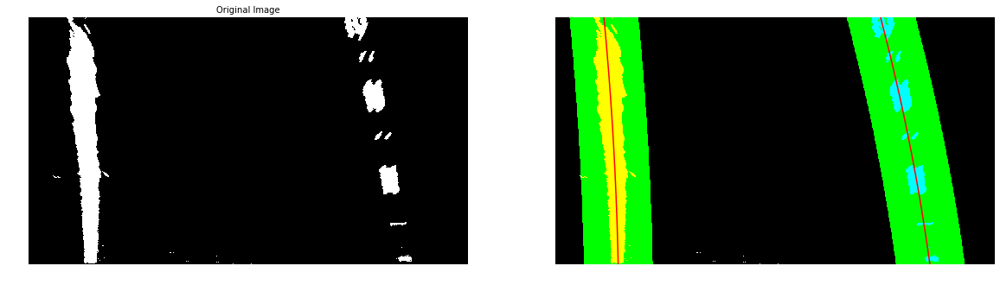

In [18]:
for img, img_name in zip(thresholded, img_names):
    
    fit_img, left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, lefty, rightx, righty = fit_polynomial(img, img_name)
    fit_img, left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, lefty, rightx, righty = search_around_poly(img, left_fit, right_fit)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meters per pixel in x dimension
    
    cv2.imwrite('media/output_images/poly_fit_{}'.format(img_name), fit_img[:, :, ::-1])
    
    left_fit_scaled, right_fit_scaled = get_scaled_fits(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix)
    
    # Calculate the radius of curvature in pixels for both lane lines
    left_curverad, right_curverad, diff, ldiff, rdiff = measure_curvature_pixels(img, ploty, 
                                                                                 left_fit_scaled, right_fit_scaled, 
                                                                                 xm_per_pix, ym_per_pix)
    f, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=10)
    ax[1].plot(left_fitx, ploty, color='red')
    ax[1].plot(right_fitx, ploty, color='red')
    ax[1].imshow(fit_img, cmap='gray')
    ax[0].axis('off')
    ax[1].axis('off')
#     break

### Pipeline

In [45]:
from utils import *

In [46]:
# ret, mtx, dist, rvecs, tvecs = calibrate_camera()

In [47]:
def pipeline(img, img_name):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    y_top = 450
    y_bottom = 720
    ht, wt = img.shape[:2]
    shift = 0

    src = np.float32([
        [580, y_top],
        [720, y_top],
        [30, y_bottom],
        [1200, y_bottom]
    ])

    dst = np.float32([
        [shift, 0],
        [wt-1, 0],
        [shift, ht+shift],
        [wt-1, ht+shift]
    ])
    
    img_size = img.shape[:2][::-1]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)
    
    ksize = 5
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(20, 225))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(10, 50))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.1, 0.5))
    hls_binary = hls_channel_threshold(warped, channel='l', thresh=210)
    lab_binary = lab_channel_threshold(warped, channel='b', thresh=150)
    r_binary = r_channel_threshold(warped, thresh=150)
    
    binary_warped = np.zeros_like(dir_binary)
    binary_warped[(hls_binary == 1) | (lab_binary == 1) | (gradx == 1)] = 1
    
    global left_line
    global right_line
    
    if left_line.detected and right_line.detected:
        fit_img, left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, lefty, rightx, righty = search_around_poly(binary_warped, 
                                                                                                                      left_line.current_fit, 
                                                                                                                      right_line.current_fit)
        
    else:
        fit_img, left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, lefty, rightx, righty = fit_polynomial(binary_warped, img_name)
    
    left_fit_scaled, right_fit_scaled = get_scaled_fits(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix)
    left_curverad, right_curverad, offset, ldiff, rdiff = measure_curvature_pixels(binary_warped, ploty, 
                                                                                   left_fit_scaled, right_fit_scaled, 
                                                                                   xm_per_pix, ym_per_pix)

    valid = sanity_check(left_line, right_line, left_fit, right_fit, left_curverad, right_curverad, ldiff, rdiff)
#     print(valid)
    if valid or left_line.bestx is None or right_line.bestx is None:
        left_line.add_detection(left_fit, left_fitx, left_curverad, ldiff, leftx, lefty)
        right_line.add_detection(right_fit, right_fitx, right_curverad, rdiff, rightx, righty)
    
    else:
        left_line.reset()
        right_line.reset()
    
#     plt.imshow()
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    
    roc = np.int((left_curverad + right_curverad) / 2)
    side = 'left' if offset < 0 else 'right'
    
    font_face = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Radius of curvature = {}m'.format(roc), (50,50), font_face, 1,(255,255,255),2)
    cv2.putText(result, 'Vehicle is {}m {} of center'.format(abs(offset), side), (50,110), font_face, 1,(255,255,255),2)
    
    return result

In [48]:
left_line = Line()
right_line = Line()

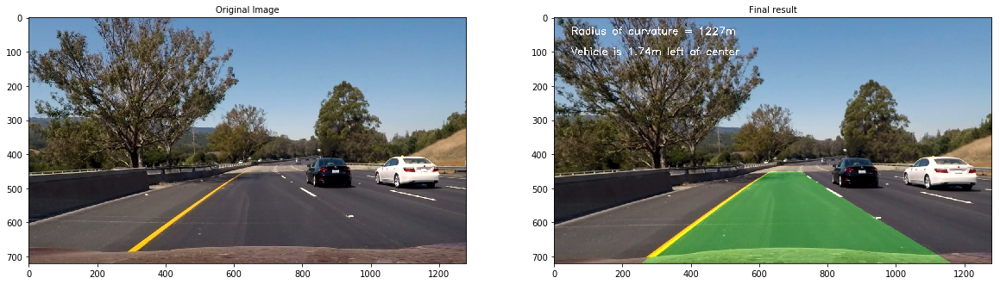

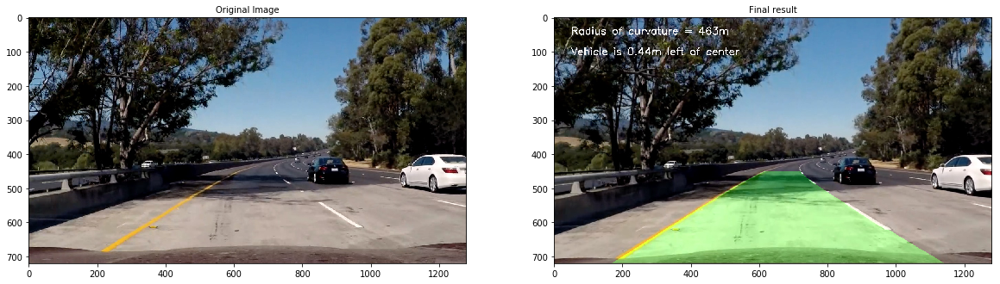

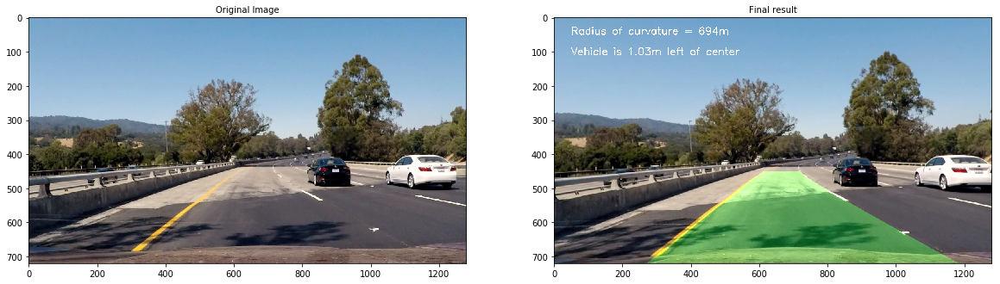

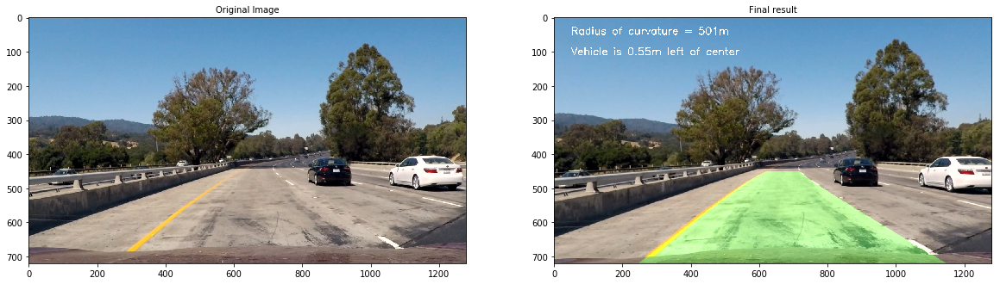

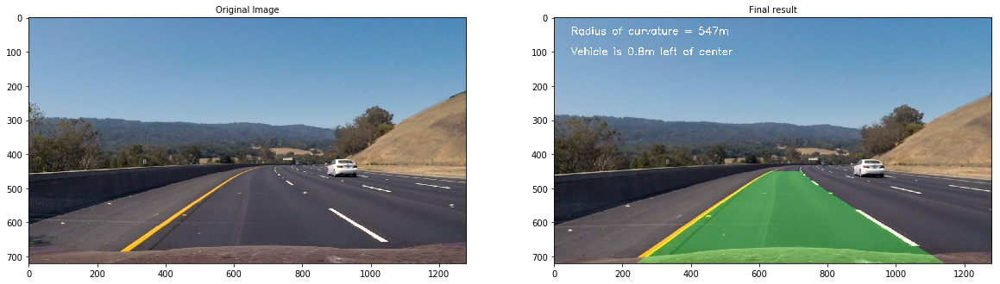

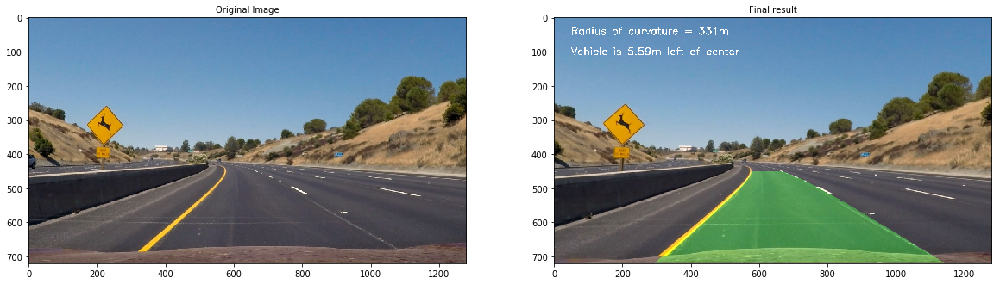

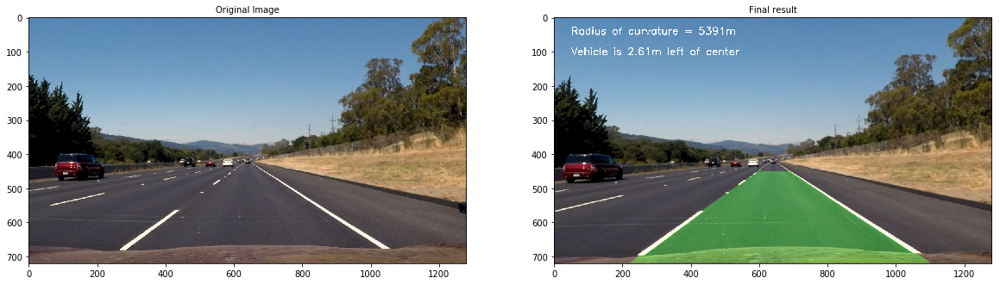

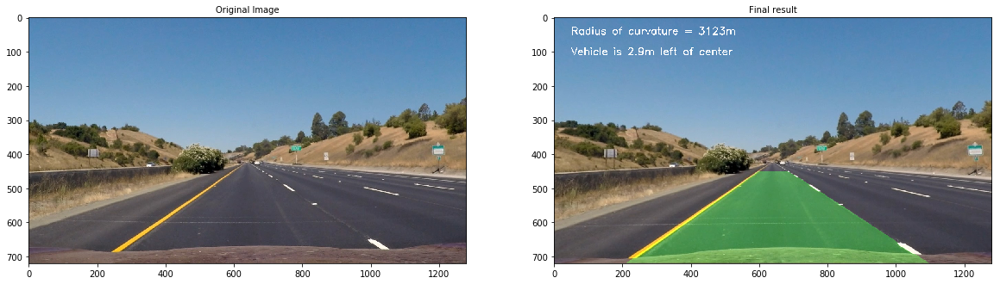

In [49]:
for img, img_name in zip(imgs, img_names):
    left_line.reset()
    right_line.reset()
    result = pipeline(img, img_name)
    f, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=10)
    ax[1].imshow(result, cmap='gray')
    ax[1].set_title('Final result', fontsize=10)
    cv2.imwrite('media/output_images/result_{}'.format(img_name), result[:, :, ::-1])
#     break

In [50]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from functools import partial

In [56]:
video_output = 'media/test_videos_output/project_video.mp4'
left_line.reset()
right_line.reset()
clip = VideoFileClip("media/project_video.mp4")
# clip = VideoFileClip("media/project_video.mp4").subclip(0,2)
video_clip = clip.fl_image(pipeline) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video media/test_videos_output/project_video.mp4.
Moviepy - Writing video media/test_videos_output/project_video.mp4



Moviepy - Done !
Moviepy - video ready media/test_videos_output/project_video.mp4
CPU times: user 22min 26s, sys: 1min 43s, total: 24min 10s
Wall time: 3min 57s


In [57]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

## Ideas for Lane Detection Pipeline

## Test on Videos

Let's try the one with the solid white lane on the right first ...